# Slam iterativo - Ejemplo:

A continuación se muestra un código en el que se ocupa el código SLAM desarrollado por Jinshisai para realizar ajustes a diagramas-pv.
Para el ejemplo, se utilizará la fuente de  C18O de Ophiucus 1.

In [1]:
#Importamos las librerias a utilizar
import numpy as np
import matplotlib.pyplot as plt
from pvanalysis import PVAnalysis
import os
import statistics

'-------- INPUTS --------'
fitsfile = './Ophiucus 1/Oph1_C18O_pvdiagram.fits'
outname = 'pvanalysis_Oph1_C18O_mTTT_tr3'  # file name header for outputs
incl = 71.  # deg
vsys = 2.3# km/s
dist = 139.  # pc
rms = 2.56e-3  # Jy/beam
thr = 3.  # rms
ridgemode = 'mean'  # 'mean' or 'gauss'
xlim = [-300, 0, 0, 300] # au; [-outlim, -inlim, inlim, outlim]
vlim = np.array([-3.5, 0, 0, 8]) + vsys  # km/s
Mlim = [0, 10]  # M_sun; to exclude unreasonable points
xlim_plot = [375./20. , 375.]  # au; [inlim, outlim]
vlim_plot = [6./20. , 13.]  # km/s
use_velocity = True  # cuts along the velocity direction
use_position = True  # cuts along the positional direction
include_vsys = True  # vsys offset. False means vsys=0.
include_dp = True  # False means a single power
include_pin = True  # False means pin=0.5 (Keplerian).
show_pv = True  # figures will be made regardless of this option.
show_corner = True  # figures will be made regardless of this option.
minabserr = 0.1  # minimum absolute errorbar in the unit of bmaj or dv.
minrelerr = 0.01  # minimum relative errorbar.
R_dust=45.66
txt_files = True #False significa que no se guardaran los parámetros del fit en archivos txt.
'------------------------'

'------------------------'

In [3]:
#########Guardamos todos los parámetros utilizados en un txt.
filename= outname+".txt"
file_txt = open("C:/Users/josem/SLAM - test/Archivos Fits/Datos obtenidos/"+filename, "w") #Guardamos en la ruta que escogamos.
file_txt.write(outname + os.linesep)                                                       
file_txt.write("inclinacion=" + str(incl) + ' deg' + os.linesep)
file_txt.write("Vsys=" + str(vsys) + ' km/s' + os.linesep)
file_txt.write("Distancia=" + str(dist) + ' pc' + os.linesep)
file_txt.write("rms=" + str(rms) + ' Jy/beam' +os.linesep)
file_txt.write("Treshold=" + str(thr) + os.linesep)
file_txt.write("ridgemode=" + ridgemode + os.linesep)
file_txt.write("Xlim=" + str(xlim) + ' au' + os.linesep)
file_txt.write("vlim=" + str(vlim) + ' km/s' + os.linesep)
file_txt.write("Mlim=" + str(Mlim) + ' Mlim' + os.linesep)
file_txt.write("xlim_plot=" + str(xlim_plot) + ' au' + os.linesep)
file_txt.write("vlim_plot=" + str(vlim_plot) + ' km/s' + os.linesep)
file_txt.write("use_velocity=" + str(use_velocity) + os.linesep)
file_txt.write("use_position=" + str(use_position) + os.linesep)
file_txt.write("include_vsys=" + str(include_vsys) + os.linesep)
file_txt.write("include_pin=" + str(include_pin) + os.linesep)
file_txt.write("Rdust=" + str(R_dust) )
file_txt.close()


read_pvfits: Input P.A.: 51.3 deg
read_pvfits: Convert frequency to velocity
Along position axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Along velocity axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Derived points in pvanalysis_Oph1_C18O_mTTT_tr3.edge.dat and pvanalysis_Oph1_C18O_mTTT_tr3.ridge.dat.


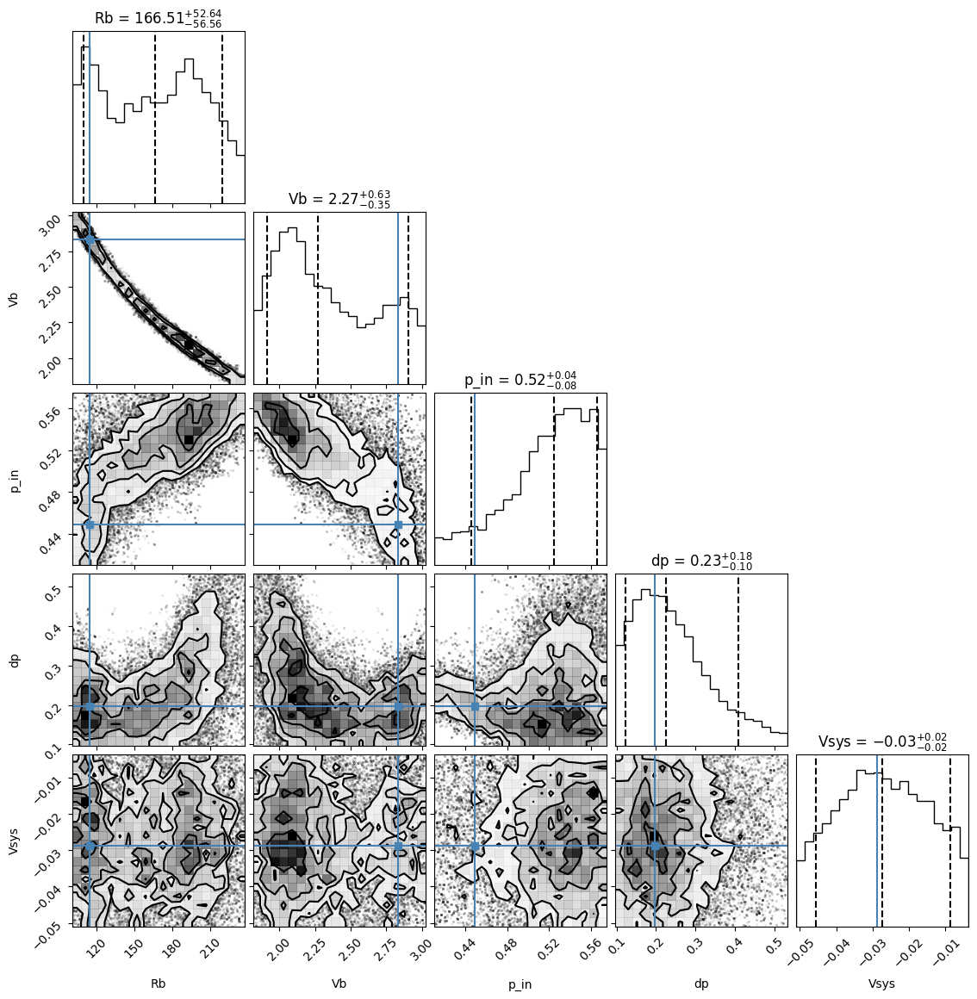

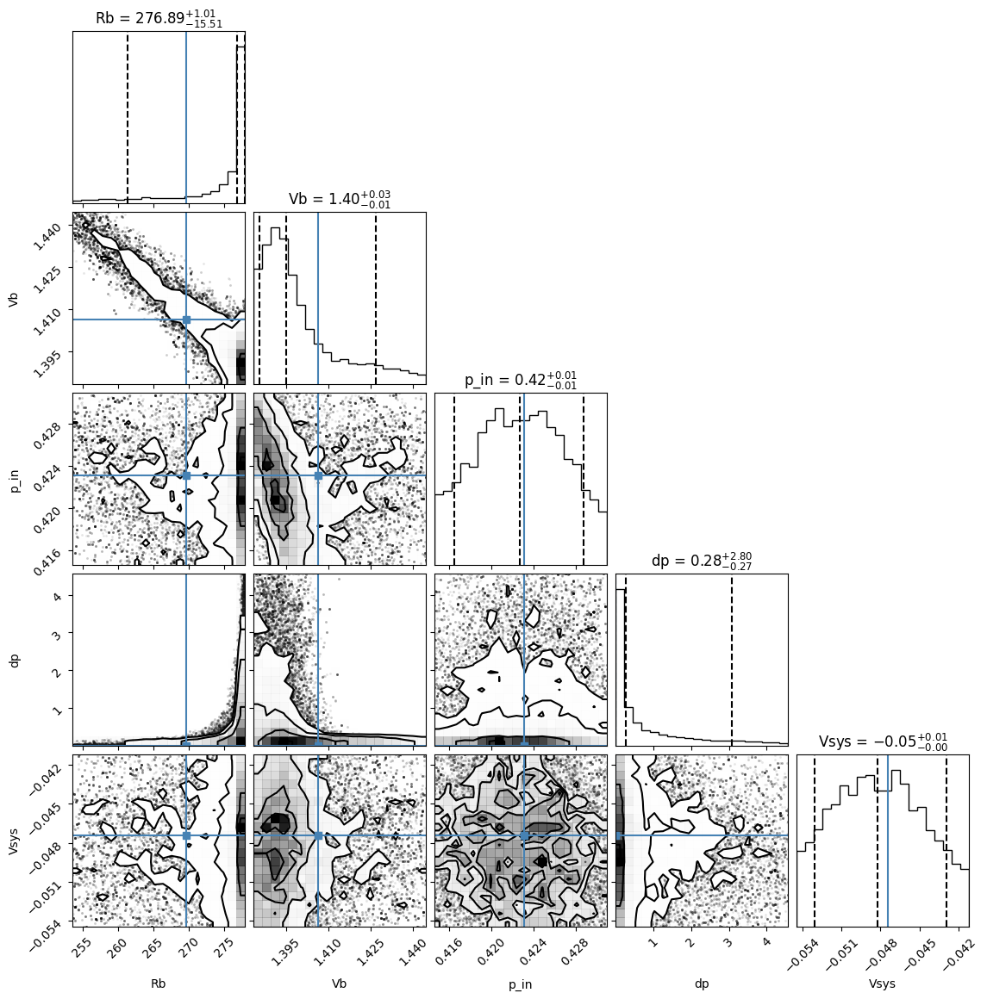

Corner plots in pvanalysis_Oph1_C18O_mTTT_tr3.corner_e.png and pvanalysis_Oph1_C18O_mTTT_tr3.corner_r.png
--- Edge ---
R_b   = 166.51 +/- 54.60 au
V_b   = 2.272 +/- 0.492 km/s
p_in  = 0.525 +/- 0.060
dp    = 0.225 +/- 0.143
v_sys = 2.273 +/- 0.018
r     = 58.72 --- 278.00 au
v     = 1.520 --- 3.900 km/s
M_in  = 1.142 +/- 0.617 Msun
M_out = 0.839 +/- 0.576 Msun
M_b   = 1.084 +/- 0.589 Msun


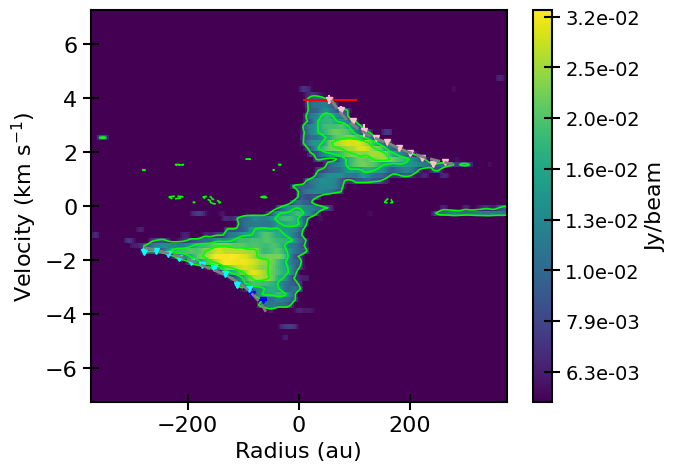

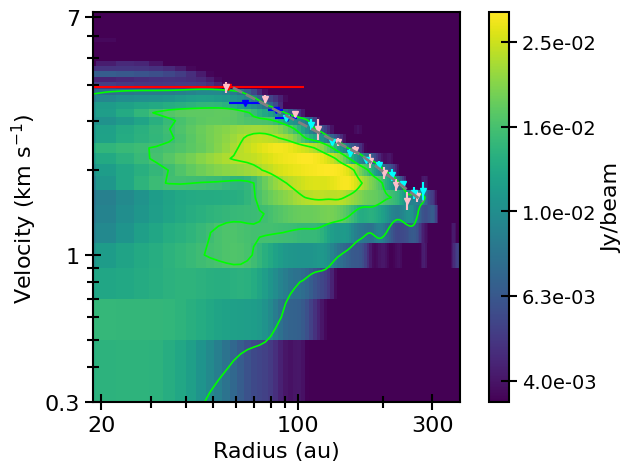

read_pvfits: Input P.A.: 51.3 deg
read_pvfits: Convert frequency to velocity
Along position axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Along velocity axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Derived points in pvanalysis_Oph1_C18O_mTTT_tr3.edge.dat and pvanalysis_Oph1_C18O_mTTT_tr3.ridge.dat.


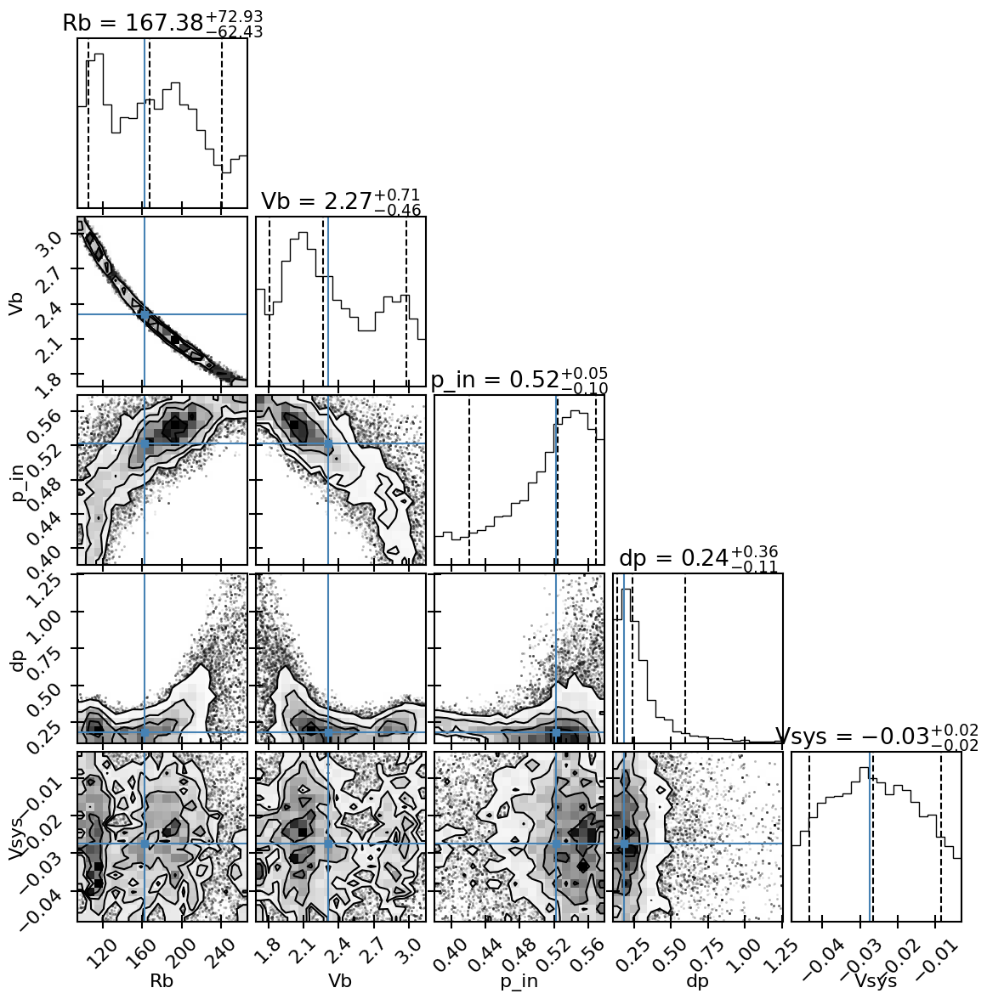

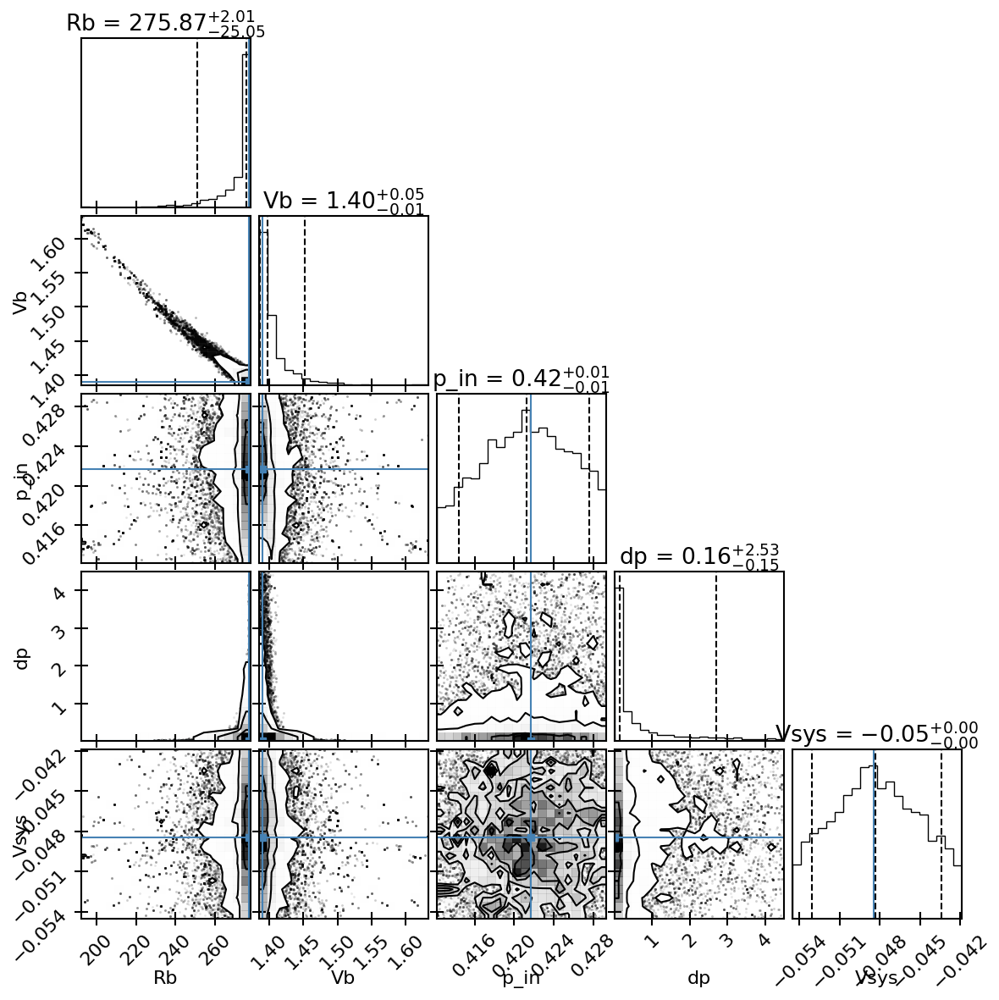

Corner plots in pvanalysis_Oph1_C18O_mTTT_tr3.corner_e.png and pvanalysis_Oph1_C18O_mTTT_tr3.corner_r.png
--- Edge ---
R_b   = 167.38 +/- 67.68 au
V_b   = 2.268 +/- 0.587 km/s
p_in  = 0.524 +/- 0.074
dp    = 0.242 +/- 0.231
v_sys = 2.273 +/- 0.018
r     = 58.73 --- 278.00 au
v     = 1.511 --- 3.900 km/s
M_in  = 1.142 +/- 0.749 Msun
M_out = 0.829 +/- 0.712 Msun
M_b   = 1.086 +/- 0.713 Msun


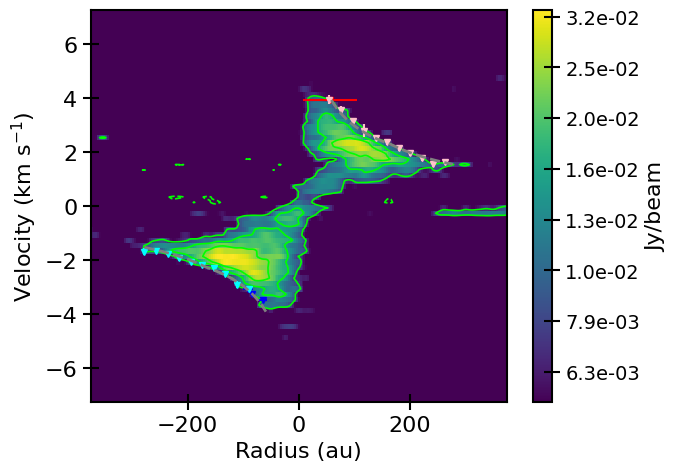

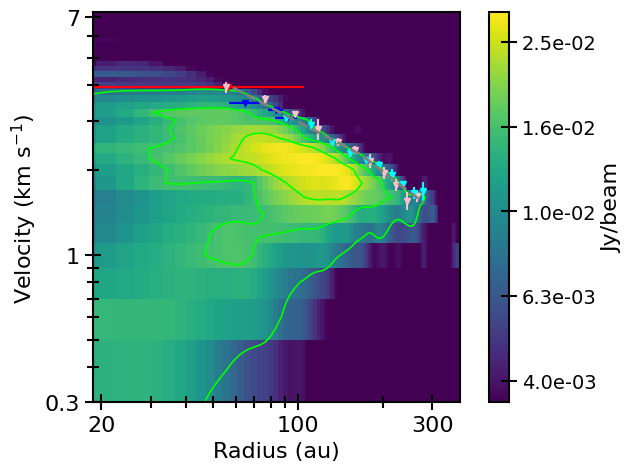

read_pvfits: Input P.A.: 51.3 deg
read_pvfits: Convert frequency to velocity
Along position axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Along velocity axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Derived points in pvanalysis_Oph1_C18O_mTTT_tr3.edge.dat and pvanalysis_Oph1_C18O_mTTT_tr3.ridge.dat.


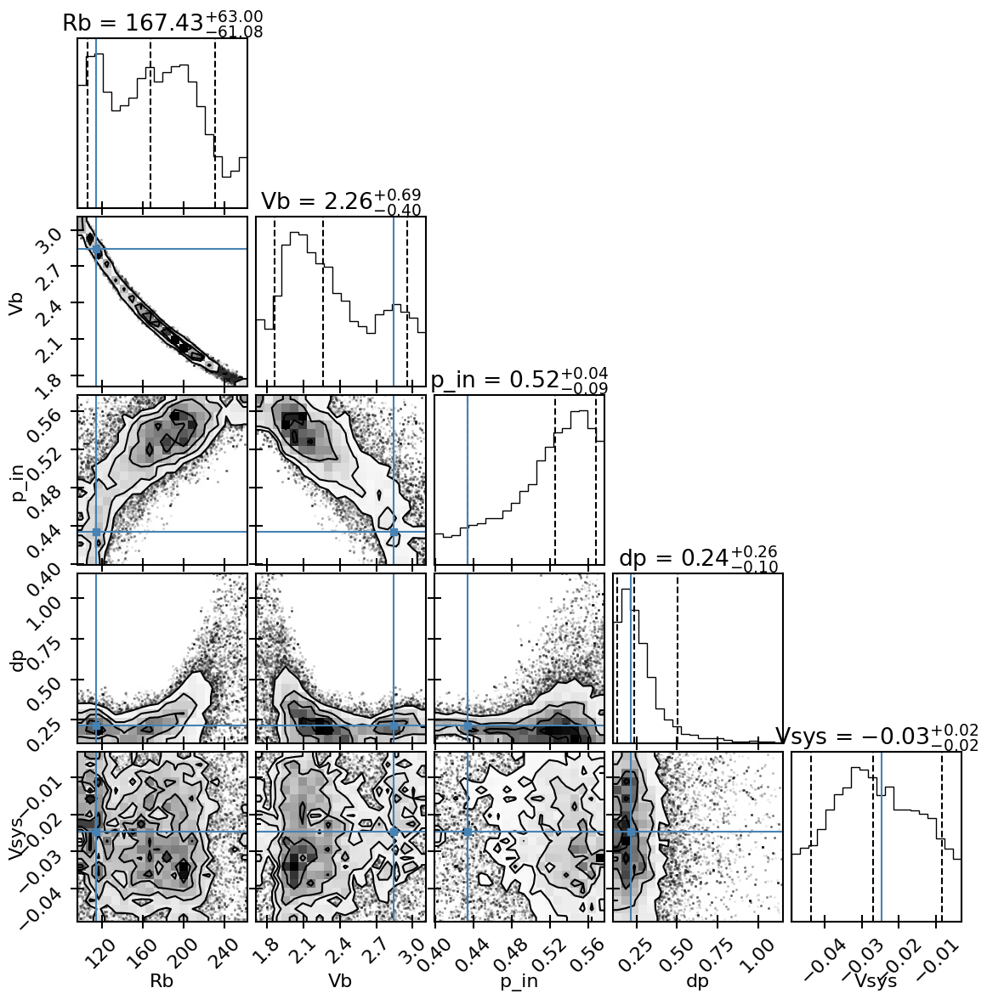

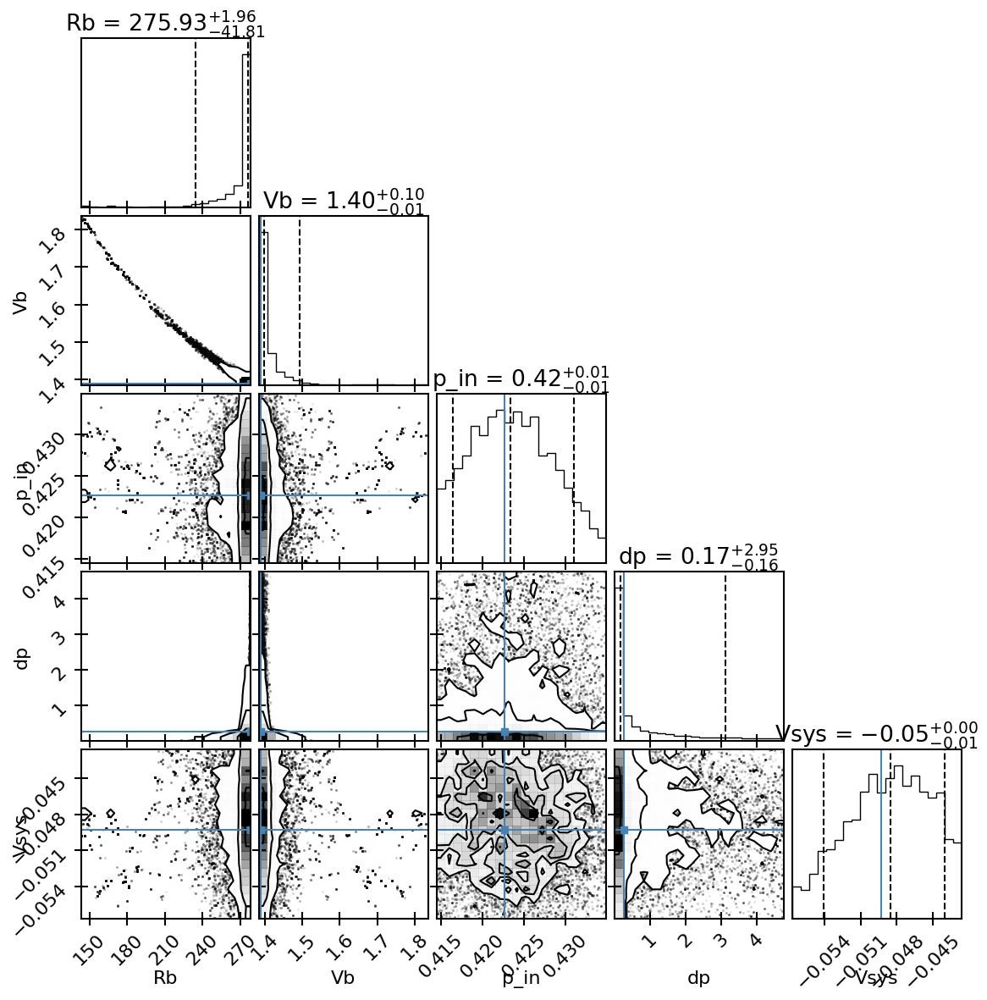

Corner plots in pvanalysis_Oph1_C18O_mTTT_tr3.corner_e.png and pvanalysis_Oph1_C18O_mTTT_tr3.corner_r.png
--- Edge ---
R_b   = 167.43 +/- 62.04 au
V_b   = 2.265 +/- 0.548 km/s
p_in  = 0.525 +/- 0.067
dp    = 0.238 +/- 0.184
v_sys = 2.273 +/- 0.018
r     = 58.68 --- 278.00 au
v     = 1.511 --- 3.900 km/s
M_in  = 1.141 +/- 0.692 Msun
M_out = 0.829 +/- 0.651 Msun
M_b   = 1.083 +/- 0.660 Msun


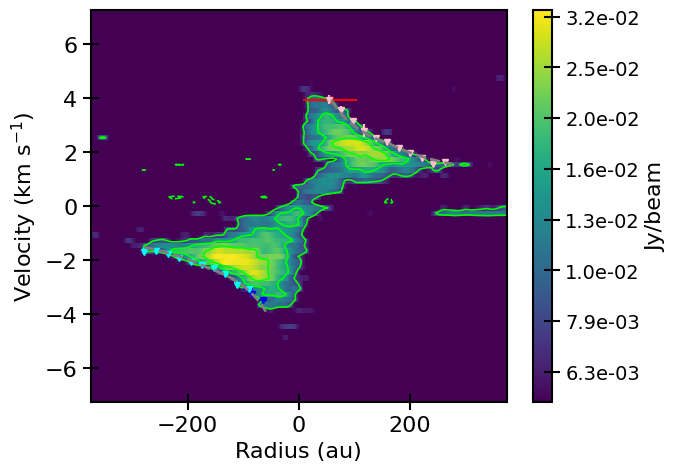

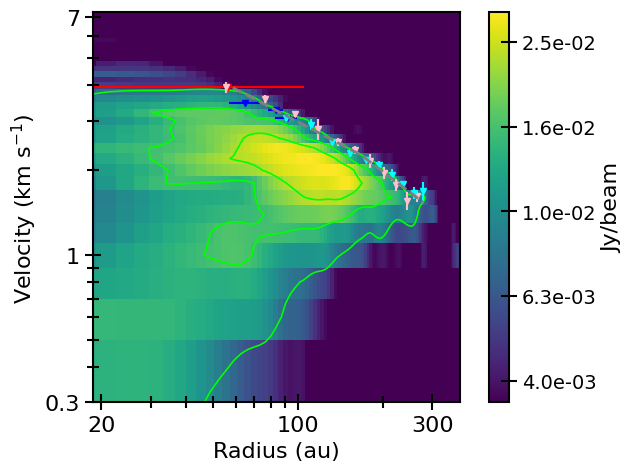

read_pvfits: Input P.A.: 51.3 deg
read_pvfits: Convert frequency to velocity
Along position axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Along velocity axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Derived points in pvanalysis_Oph1_C18O_mTTT_tr3.edge.dat and pvanalysis_Oph1_C18O_mTTT_tr3.ridge.dat.


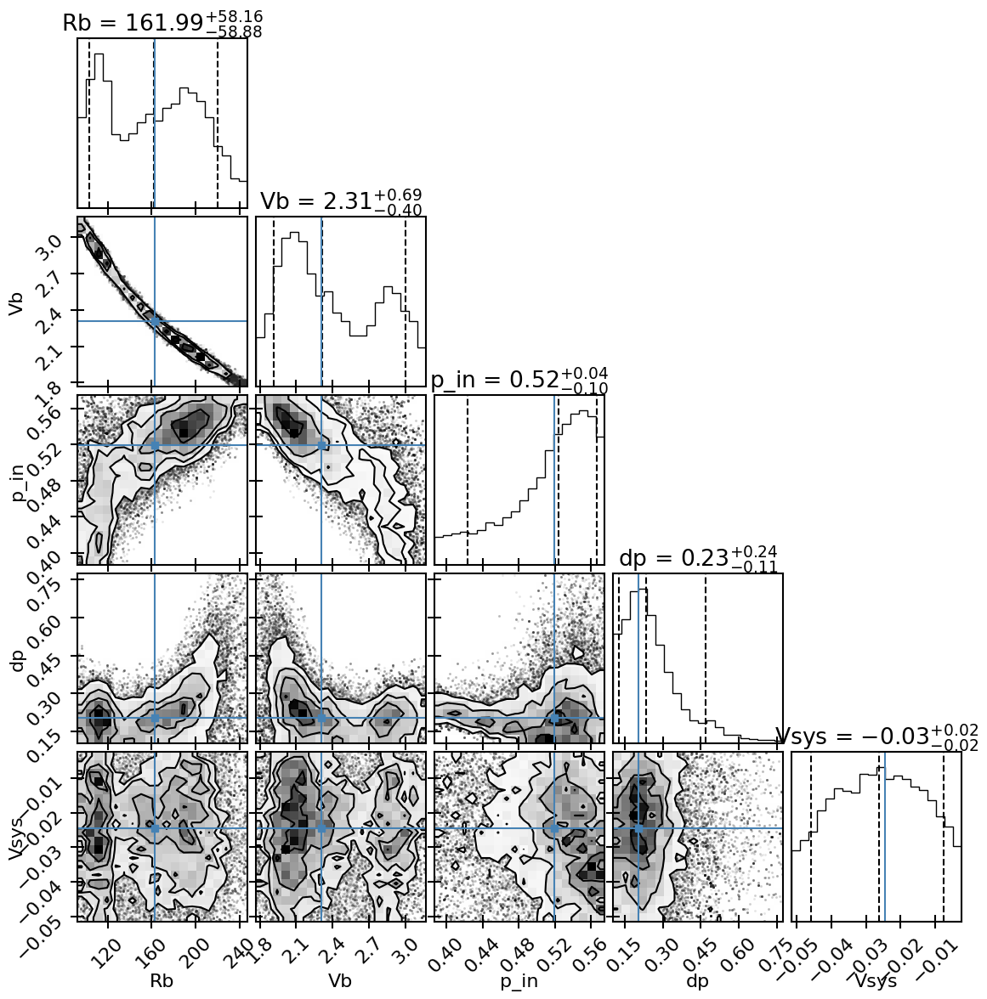

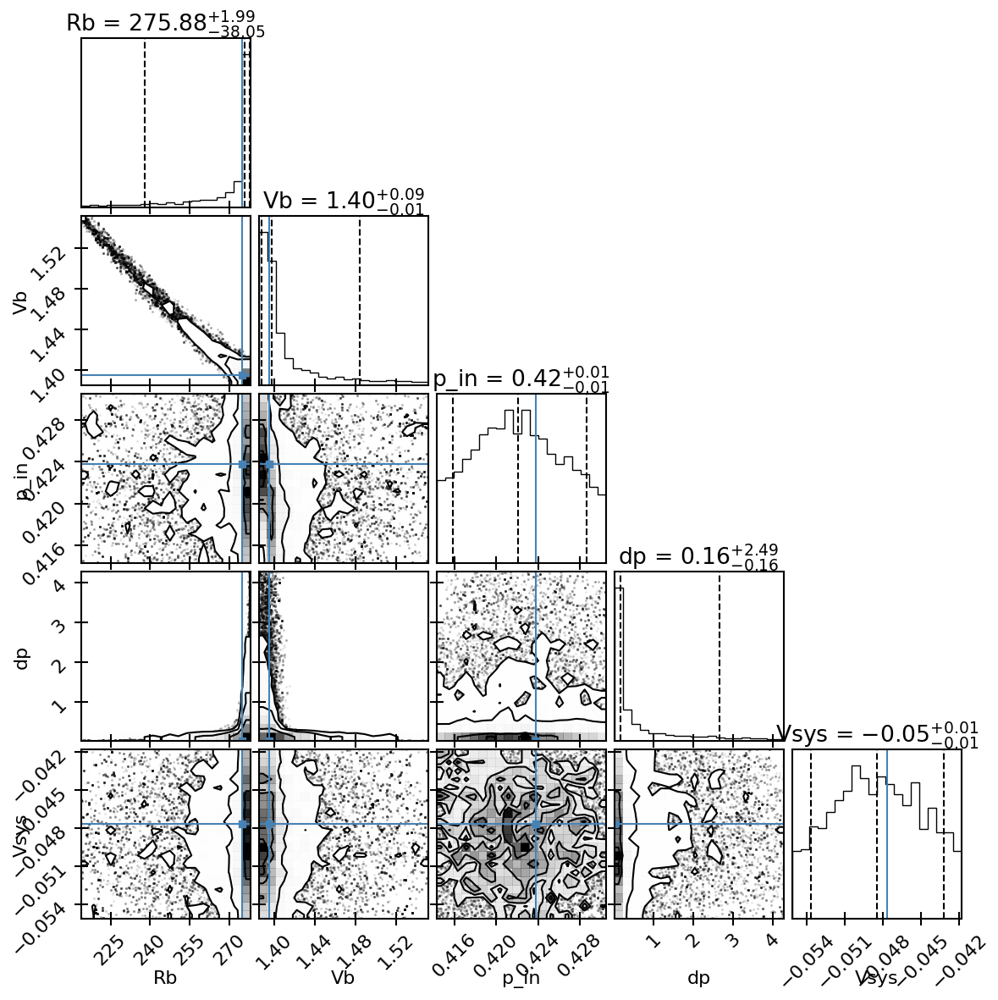

Corner plots in pvanalysis_Oph1_C18O_mTTT_tr3.corner_e.png and pvanalysis_Oph1_C18O_mTTT_tr3.corner_r.png
--- Edge ---
R_b   = 161.99 +/- 58.52 au
V_b   = 2.312 +/- 0.542 km/s
p_in  = 0.524 +/- 0.071
dp    = 0.232 +/- 0.171
v_sys = 2.274 +/- 0.019
r     = 58.92 --- 278.00 au
v     = 1.511 --- 3.900 km/s
M_in  = 1.145 +/- 0.678 Msun
M_out = 0.828 +/- 0.630 Msun
M_b   = 1.092 +/- 0.647 Msun


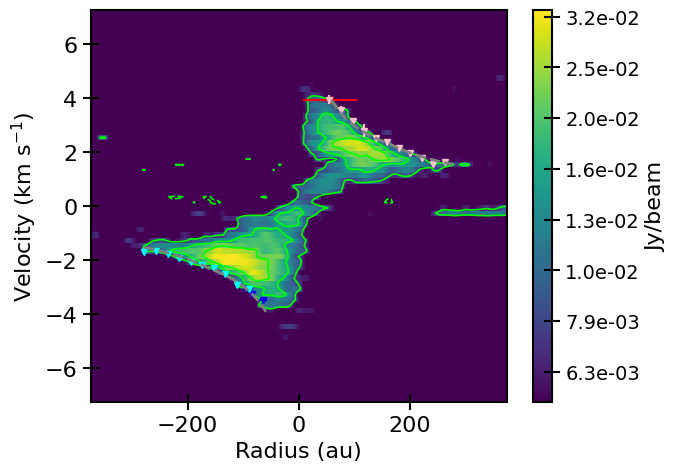

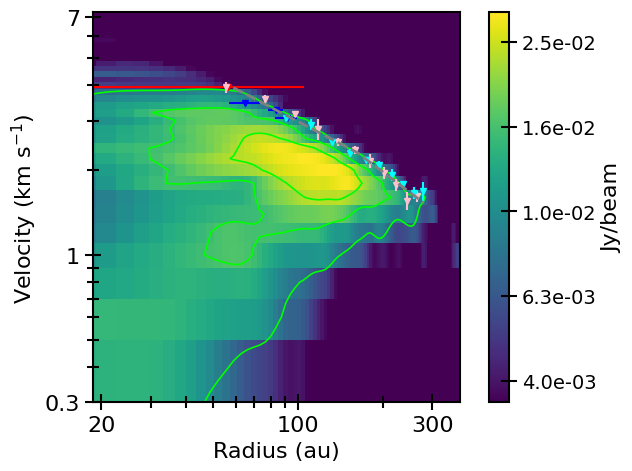

read_pvfits: Input P.A.: 51.3 deg
read_pvfits: Convert frequency to velocity
Along position axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Along velocity axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Derived points in pvanalysis_Oph1_C18O_mTTT_tr3.edge.dat and pvanalysis_Oph1_C18O_mTTT_tr3.ridge.dat.


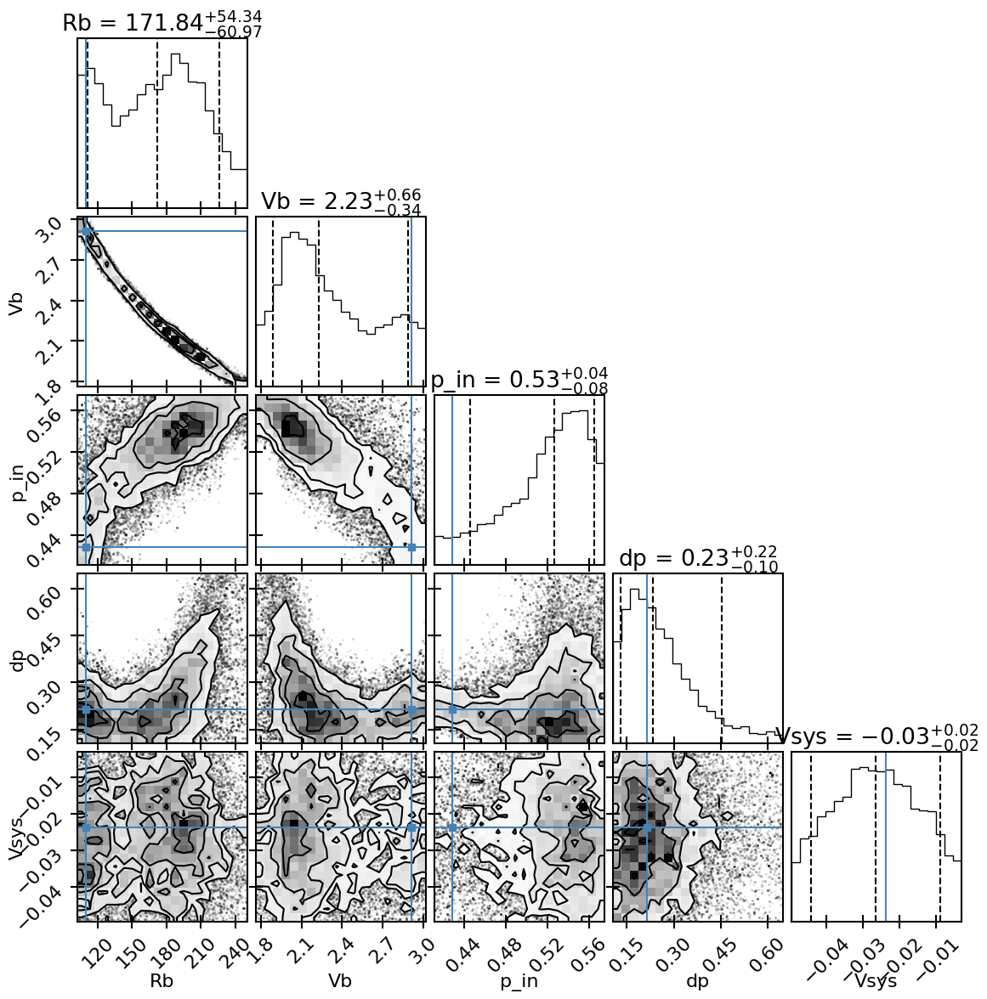

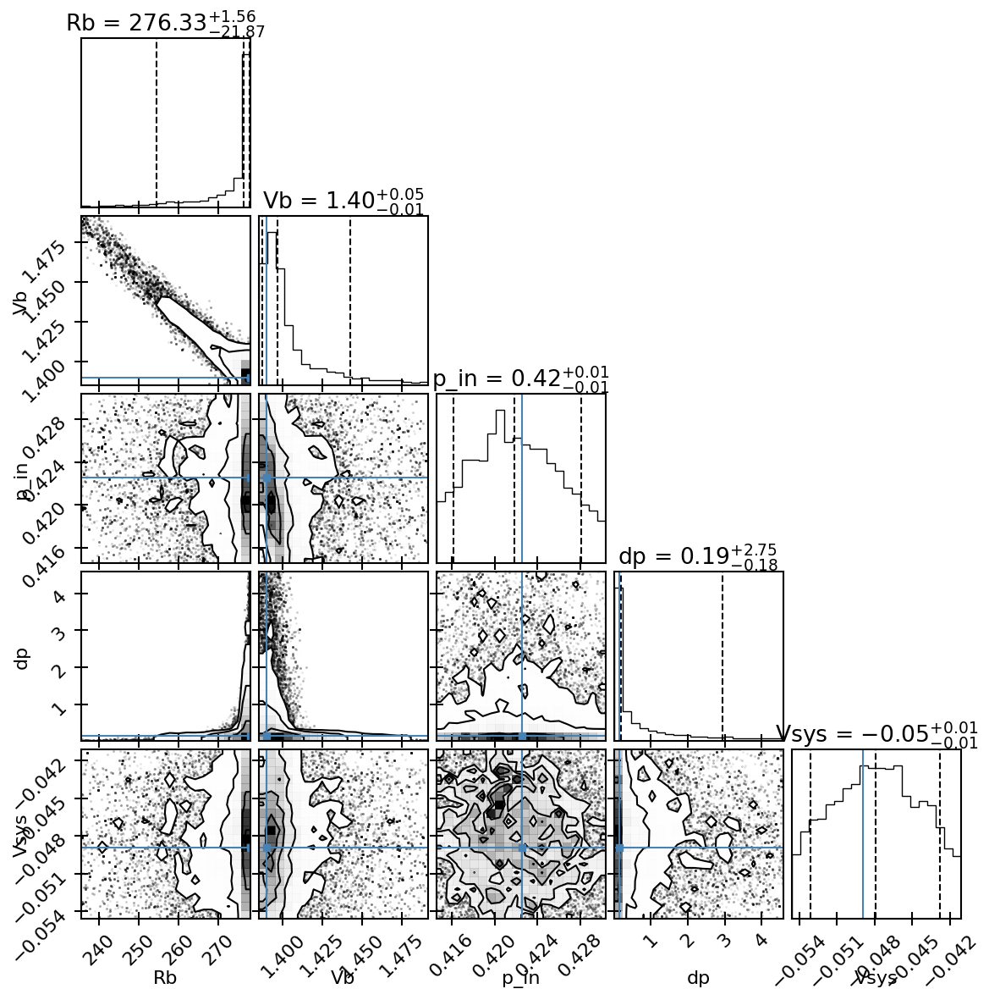

Corner plots in pvanalysis_Oph1_C18O_mTTT_tr3.corner_e.png and pvanalysis_Oph1_C18O_mTTT_tr3.corner_r.png
--- Edge ---
R_b   = 171.84 +/- 57.65 au
V_b   = 2.228 +/- 0.501 km/s
p_in  = 0.527 +/- 0.060
dp    = 0.234 +/- 0.161
v_sys = 2.274 +/- 0.018
r     = 58.63 --- 278.00 au
v     = 1.519 --- 3.900 km/s
M_in  = 1.140 +/- 0.634 Msun
M_out = 0.837 +/- 0.596 Msun
M_b   = 1.076 +/- 0.603 Msun


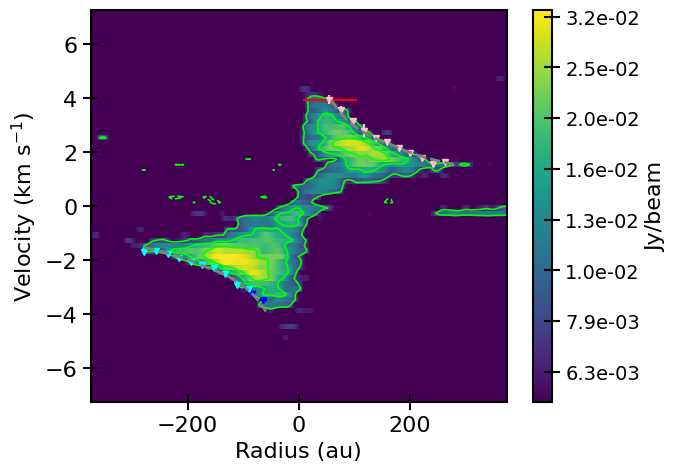

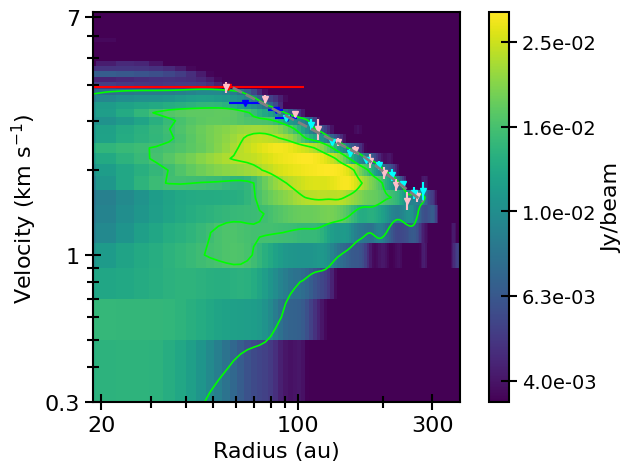

read_pvfits: Input P.A.: 51.3 deg
read_pvfits: Convert frequency to velocity
Along position axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Along velocity axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Derived points in pvanalysis_Oph1_C18O_mTTT_tr3.edge.dat and pvanalysis_Oph1_C18O_mTTT_tr3.ridge.dat.


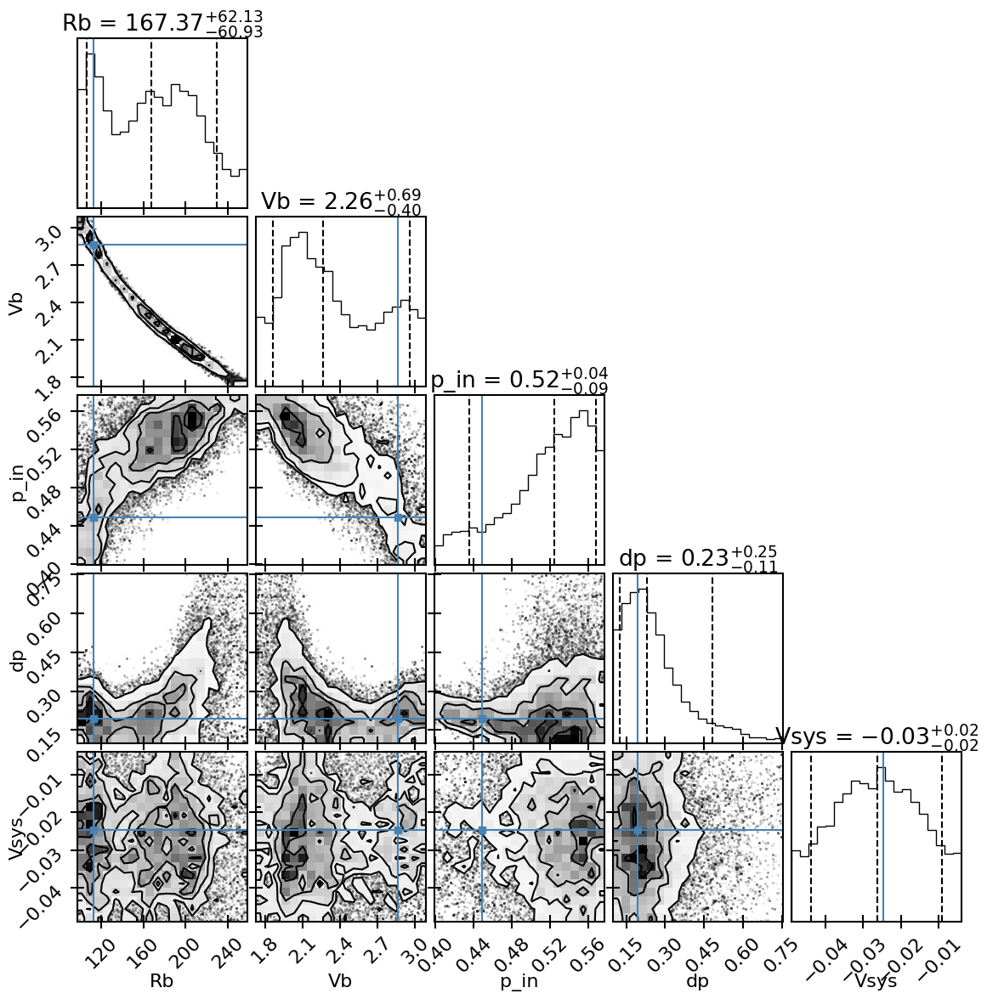

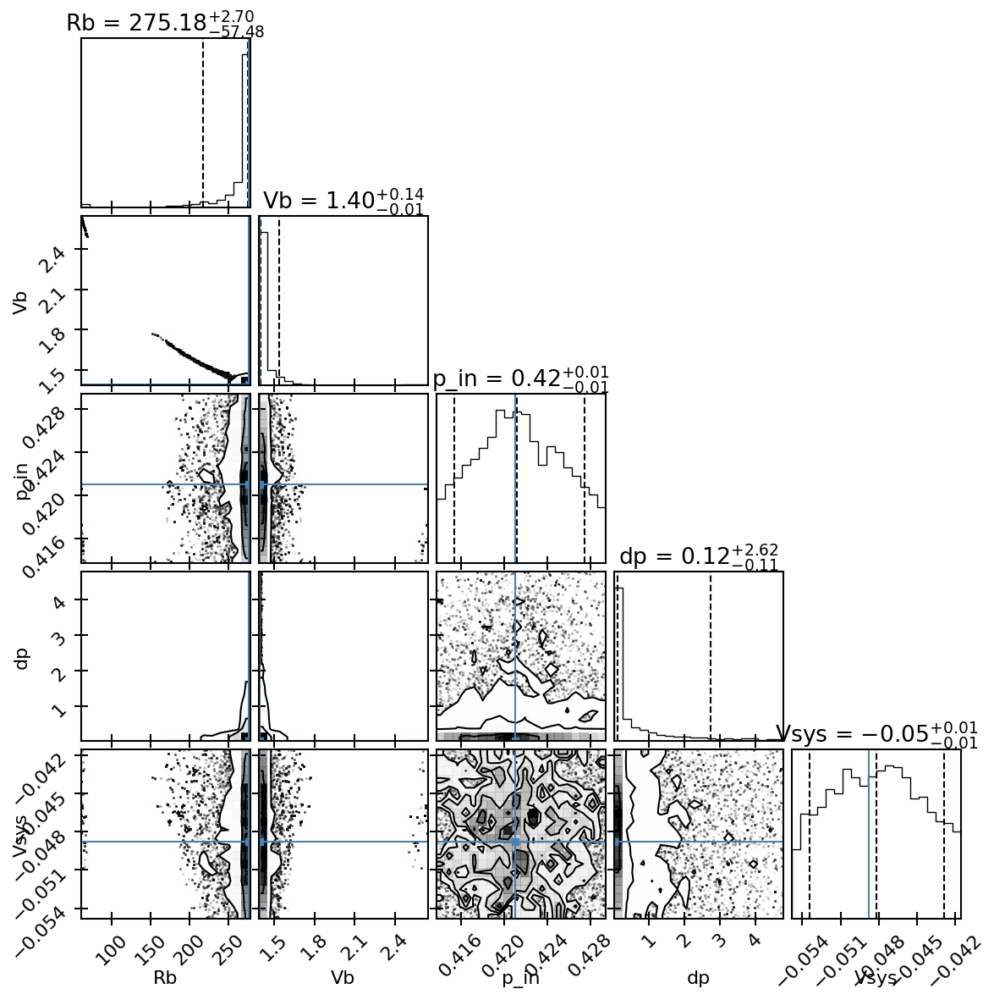

Corner plots in pvanalysis_Oph1_C18O_mTTT_tr3.corner_e.png and pvanalysis_Oph1_C18O_mTTT_tr3.corner_r.png
--- Edge ---
R_b   = 167.37 +/- 61.53 au
V_b   = 2.264 +/- 0.547 km/s
p_in  = 0.525 +/- 0.066
dp    = 0.231 +/- 0.179
v_sys = 2.274 +/- 0.017
r     = 58.59 --- 278.00 au
v     = 1.517 --- 3.900 km/s
M_in  = 1.139 +/- 0.688 Msun
M_out = 0.835 +/- 0.647 Msun
M_b   = 1.082 +/- 0.657 Msun


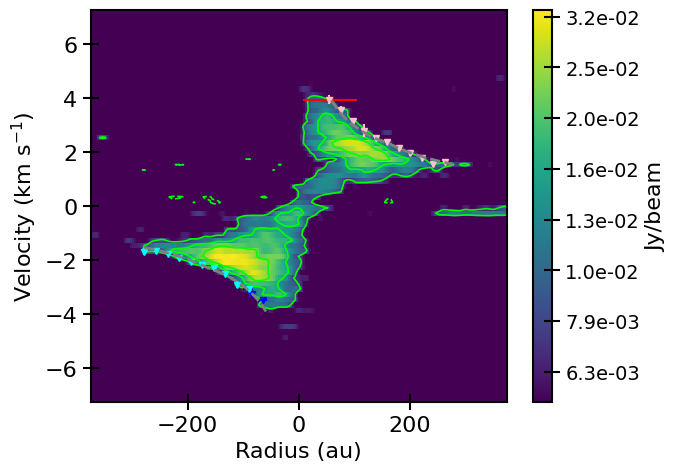

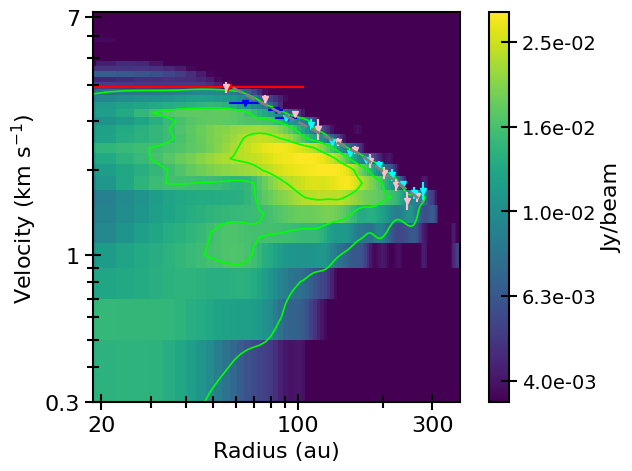

read_pvfits: Input P.A.: 51.3 deg
read_pvfits: Convert frequency to velocity
Along position axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Along velocity axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Derived points in pvanalysis_Oph1_C18O_mTTT_tr3.edge.dat and pvanalysis_Oph1_C18O_mTTT_tr3.ridge.dat.


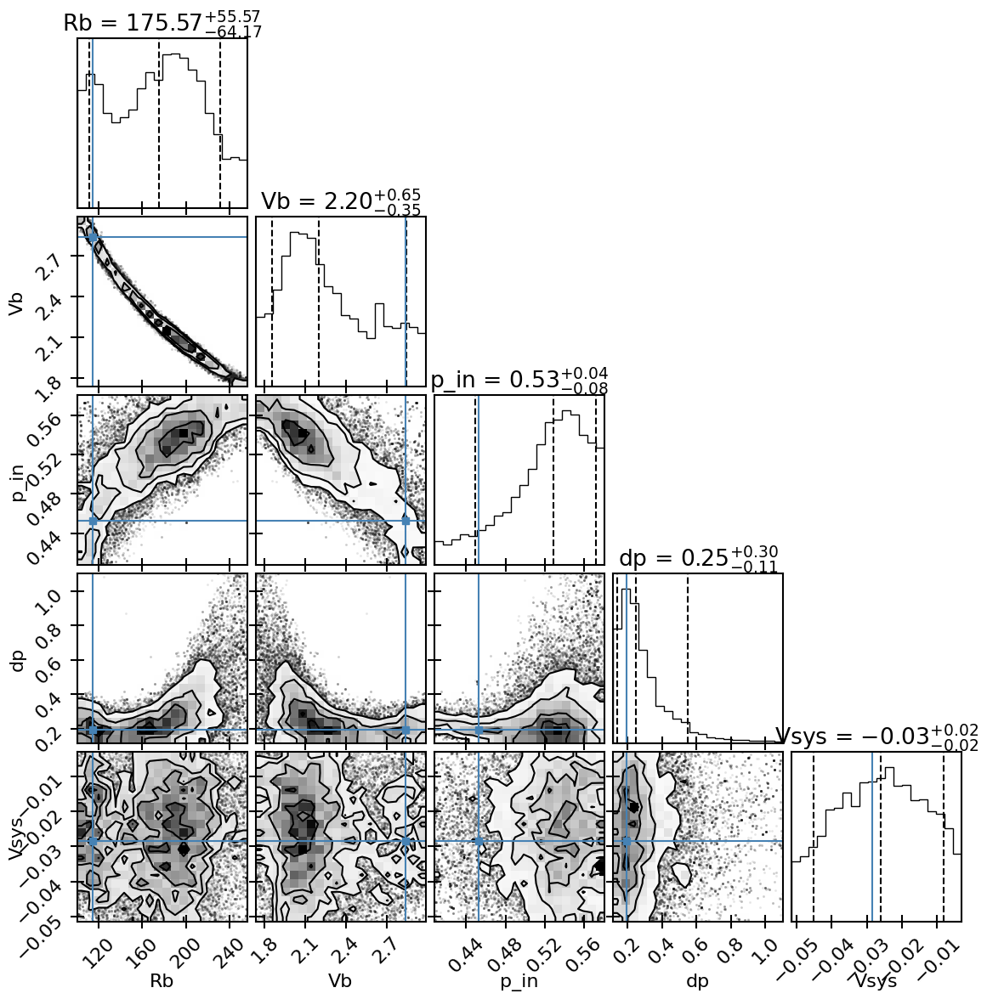

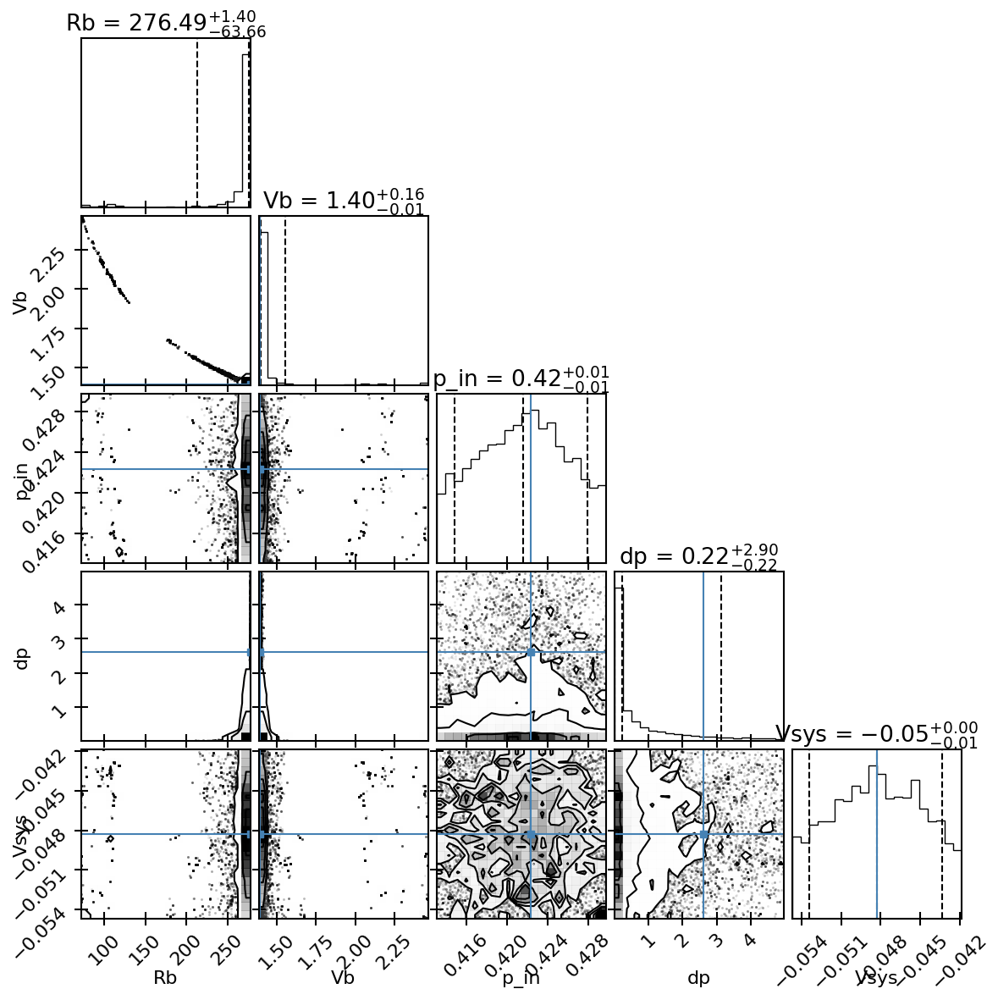

Corner plots in pvanalysis_Oph1_C18O_mTTT_tr3.corner_e.png and pvanalysis_Oph1_C18O_mTTT_tr3.corner_r.png
--- Edge ---
R_b   = 175.57 +/- 59.87 au
V_b   = 2.202 +/- 0.498 km/s
p_in  = 0.529 +/- 0.061
dp    = 0.248 +/- 0.204
v_sys = 2.274 +/- 0.019
r     = 58.83 --- 278.00 au
v     = 1.514 --- 3.900 km/s
M_in  = 1.143 +/- 0.642 Msun
M_out = 0.832 +/- 0.613 Msun
M_b   = 1.073 +/- 0.608 Msun


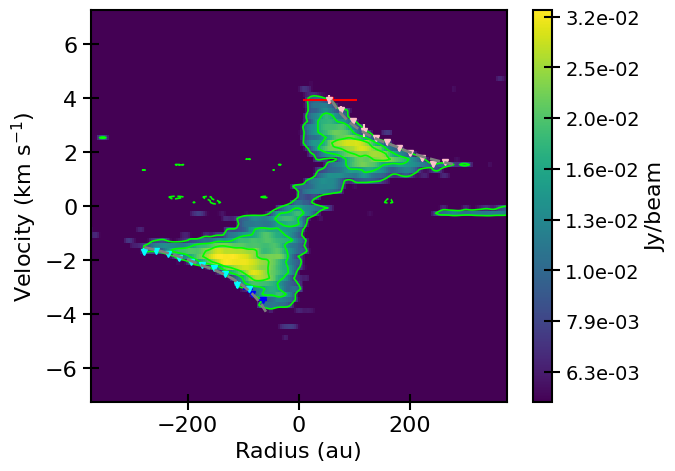

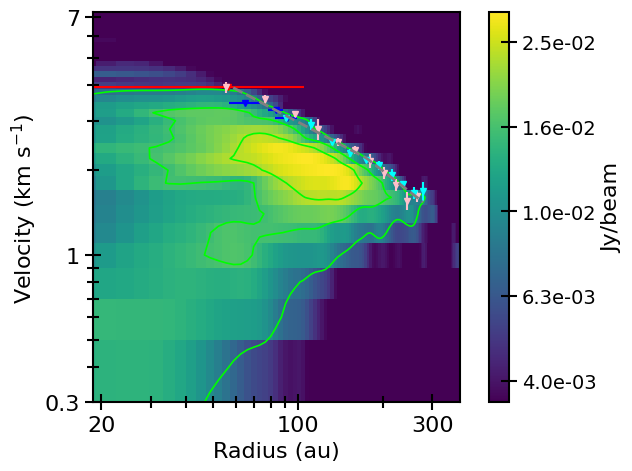

read_pvfits: Input P.A.: 51.3 deg
read_pvfits: Convert frequency to velocity
Along position axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Along velocity axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Derived points in pvanalysis_Oph1_C18O_mTTT_tr3.edge.dat and pvanalysis_Oph1_C18O_mTTT_tr3.ridge.dat.


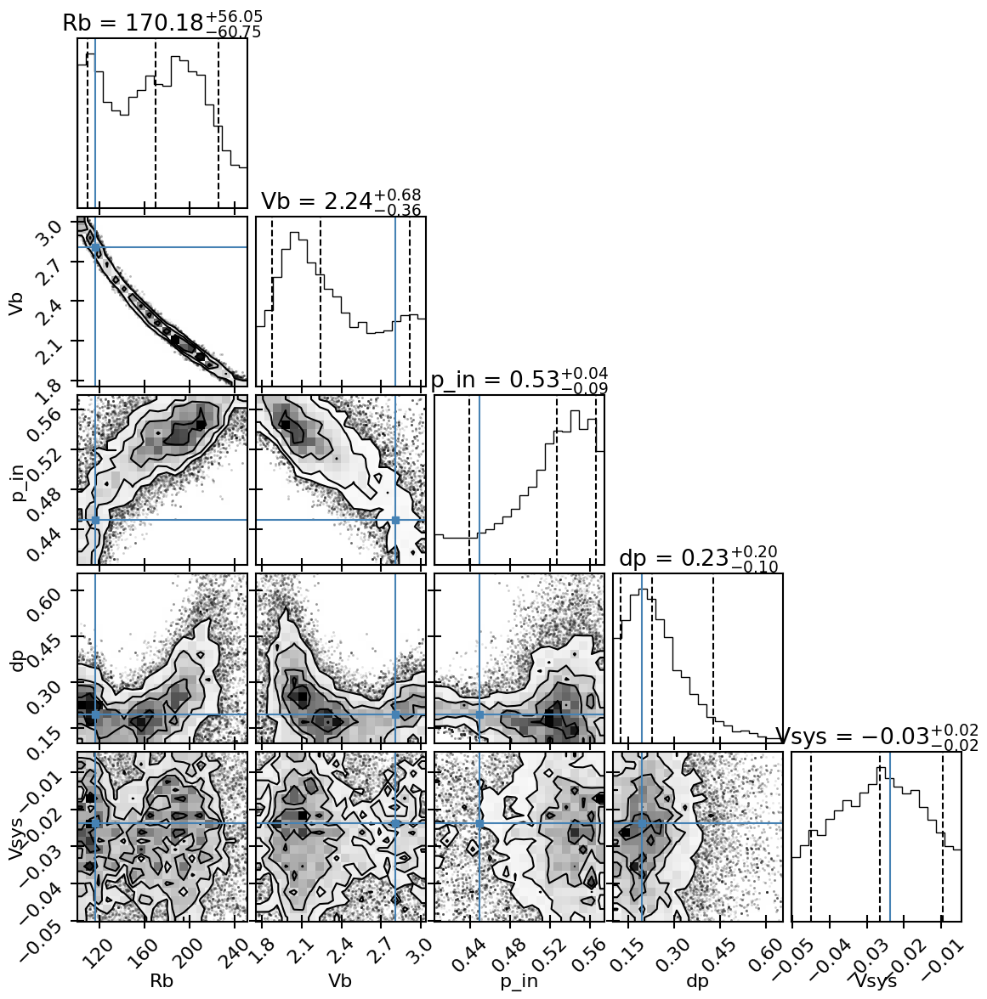

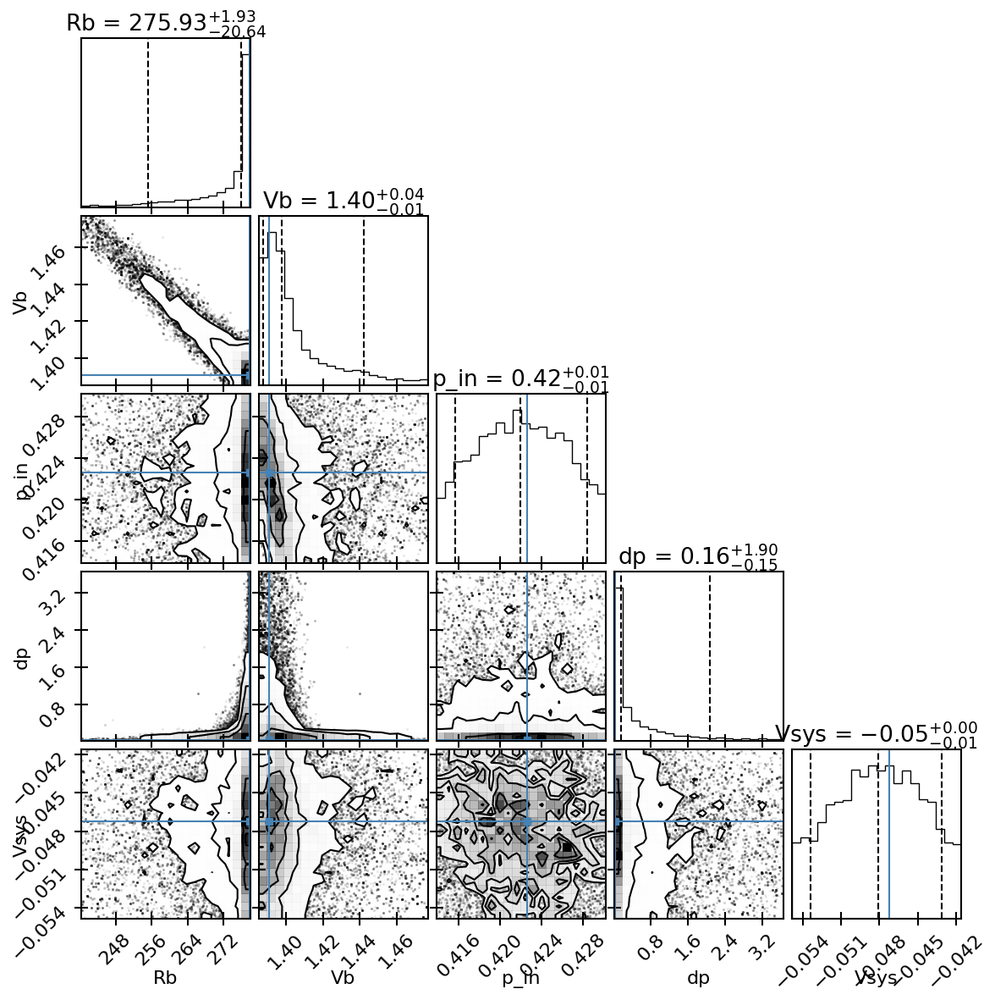

Corner plots in pvanalysis_Oph1_C18O_mTTT_tr3.corner_e.png and pvanalysis_Oph1_C18O_mTTT_tr3.corner_r.png
--- Edge ---
R_b   = 170.18 +/- 58.40 au
V_b   = 2.240 +/- 0.521 km/s
p_in  = 0.527 +/- 0.063
dp    = 0.229 +/- 0.151
v_sys = 2.273 +/- 0.018
r     = 58.65 --- 278.00 au
v     = 1.519 --- 3.900 km/s
M_in  = 1.140 +/- 0.654 Msun
M_out = 0.838 +/- 0.610 Msun
M_b   = 1.077 +/- 0.622 Msun


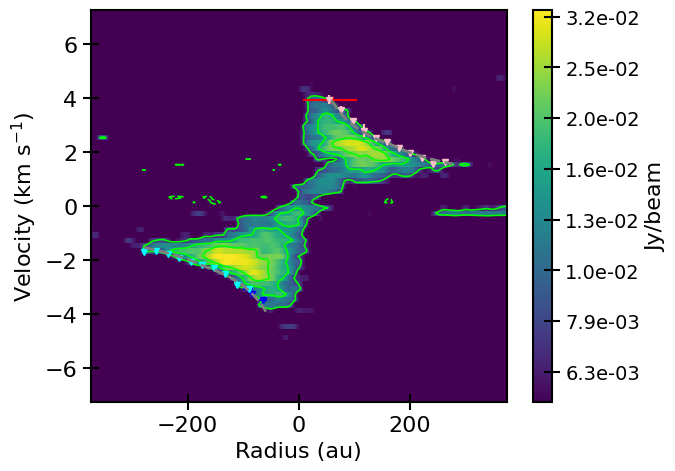

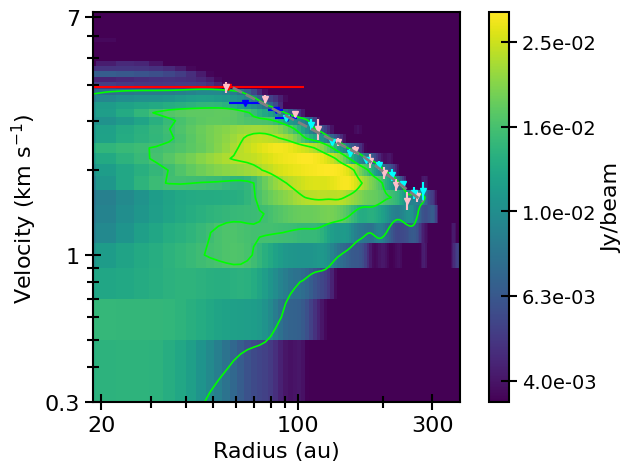

read_pvfits: Input P.A.: 51.3 deg
read_pvfits: Convert frequency to velocity
Along position axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Along velocity axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Derived points in pvanalysis_Oph1_C18O_mTTT_tr3.edge.dat and pvanalysis_Oph1_C18O_mTTT_tr3.ridge.dat.


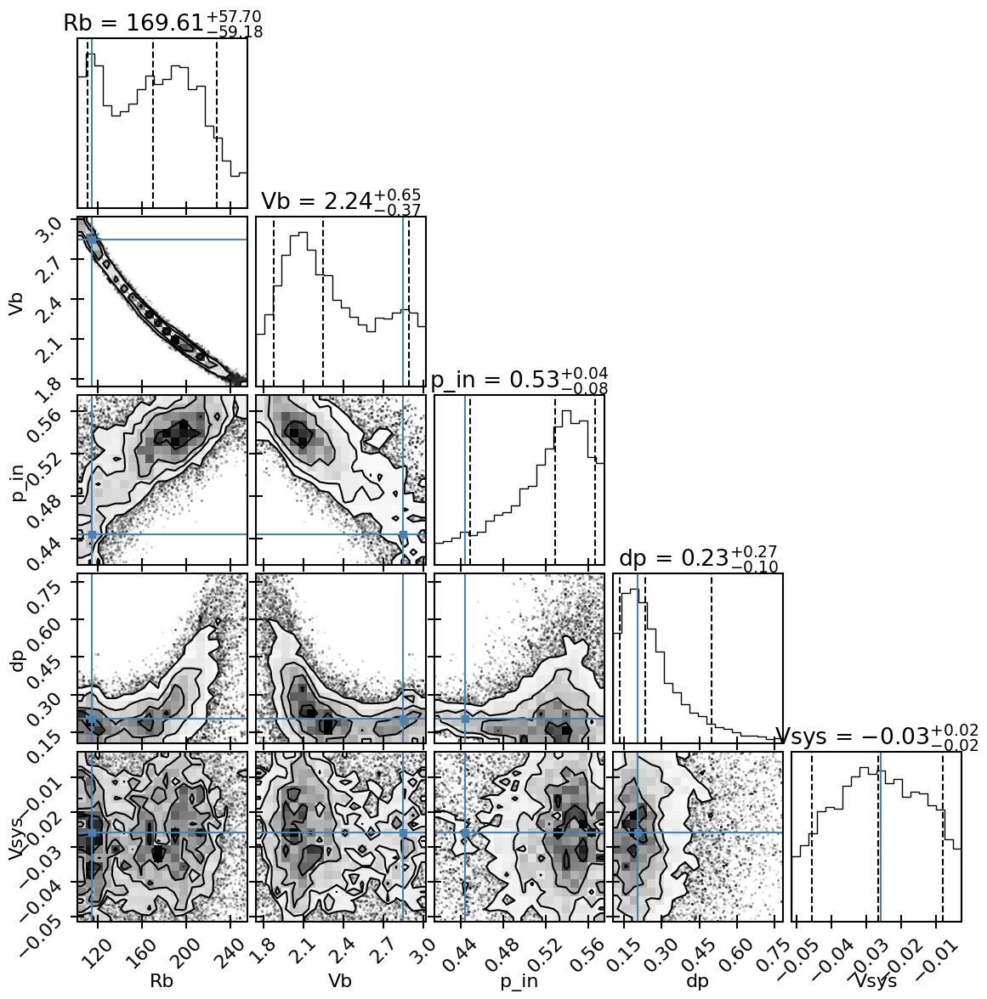

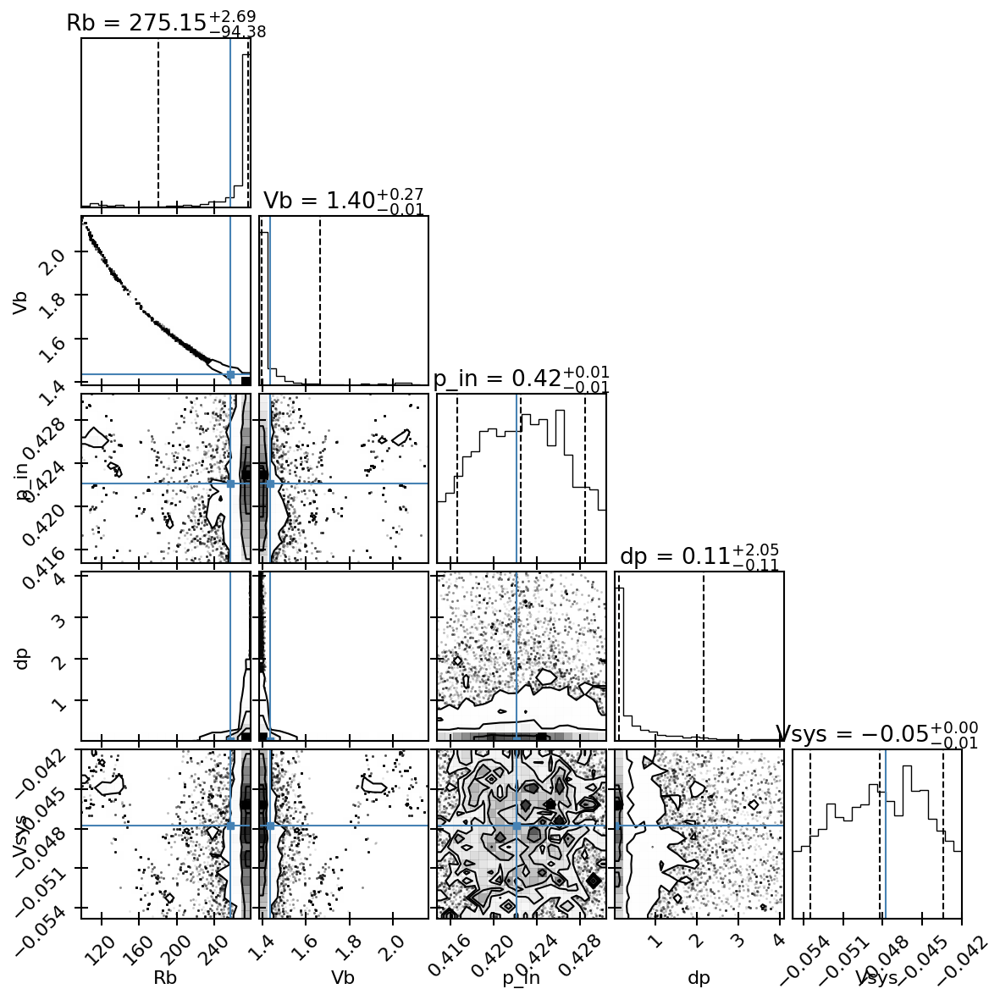

Corner plots in pvanalysis_Oph1_C18O_mTTT_tr3.corner_e.png and pvanalysis_Oph1_C18O_mTTT_tr3.corner_r.png
--- Edge ---
R_b   = 169.61 +/- 58.44 au
V_b   = 2.245 +/- 0.507 km/s
p_in  = 0.529 +/- 0.058
dp    = 0.233 +/- 0.184
v_sys = 2.273 +/- 0.019
r     = 58.89 --- 278.00 au
v     = 1.514 --- 3.900 km/s
M_in  = 1.145 +/- 0.642 Msun
M_out = 0.832 +/- 0.608 Msun
M_b   = 1.078 +/- 0.612 Msun


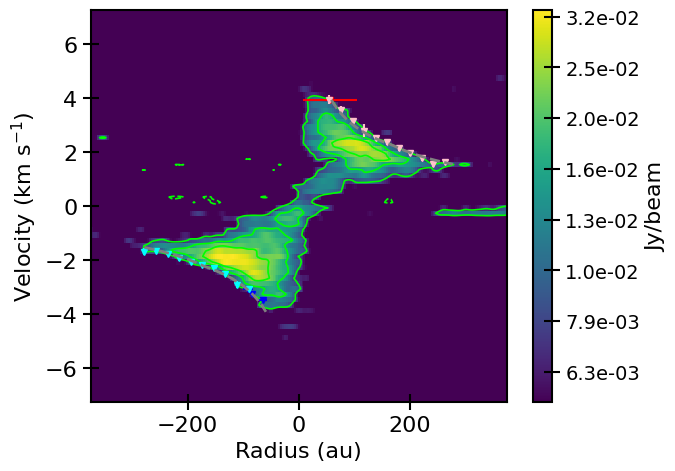

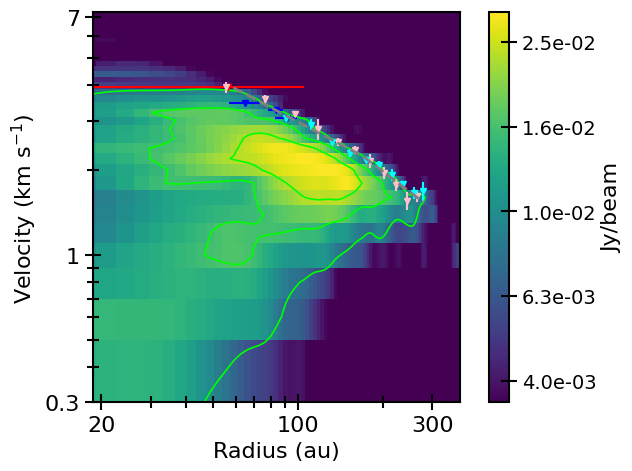

read_pvfits: Input P.A.: 51.3 deg
read_pvfits: Convert frequency to velocity
Along position axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Along velocity axis.
x range: -2.15 -- 2.15 arcsec
v range: -1.20 -- 10.20 km/s
Derived points in pvanalysis_Oph1_C18O_mTTT_tr3.edge.dat and pvanalysis_Oph1_C18O_mTTT_tr3.ridge.dat.


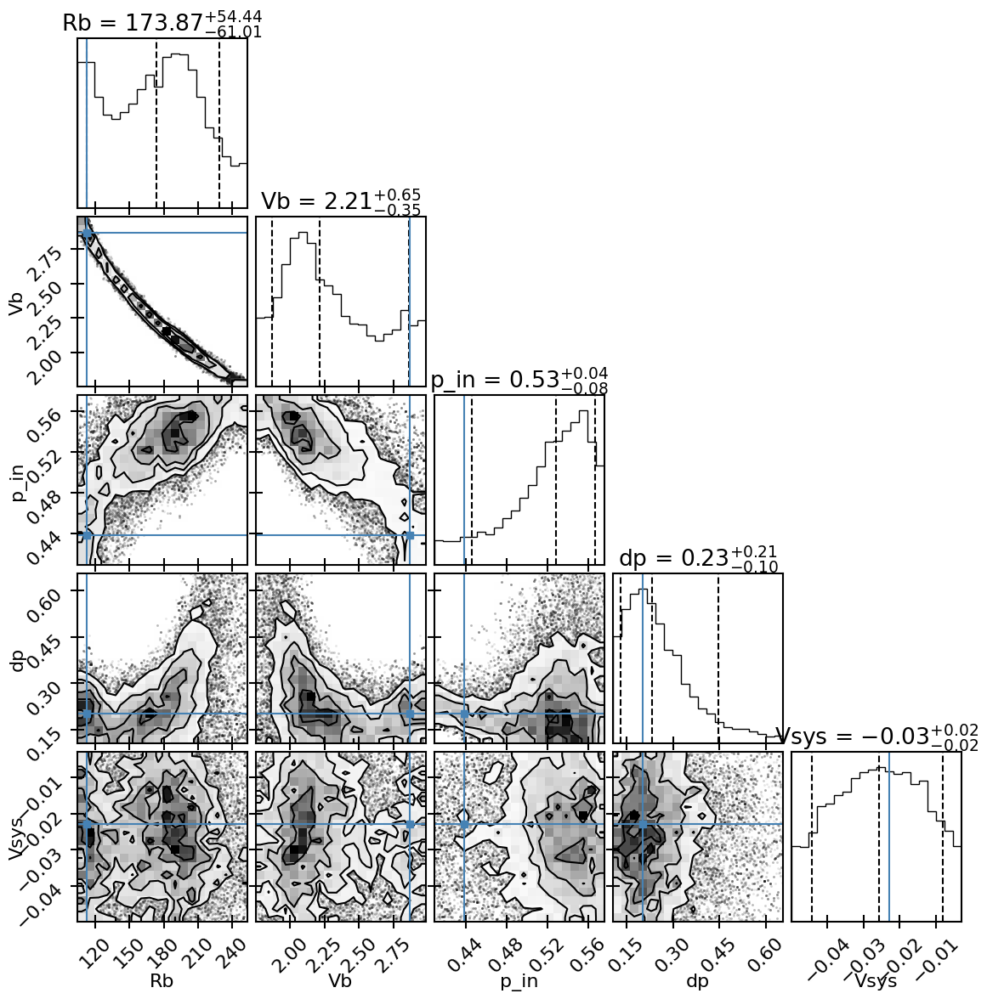

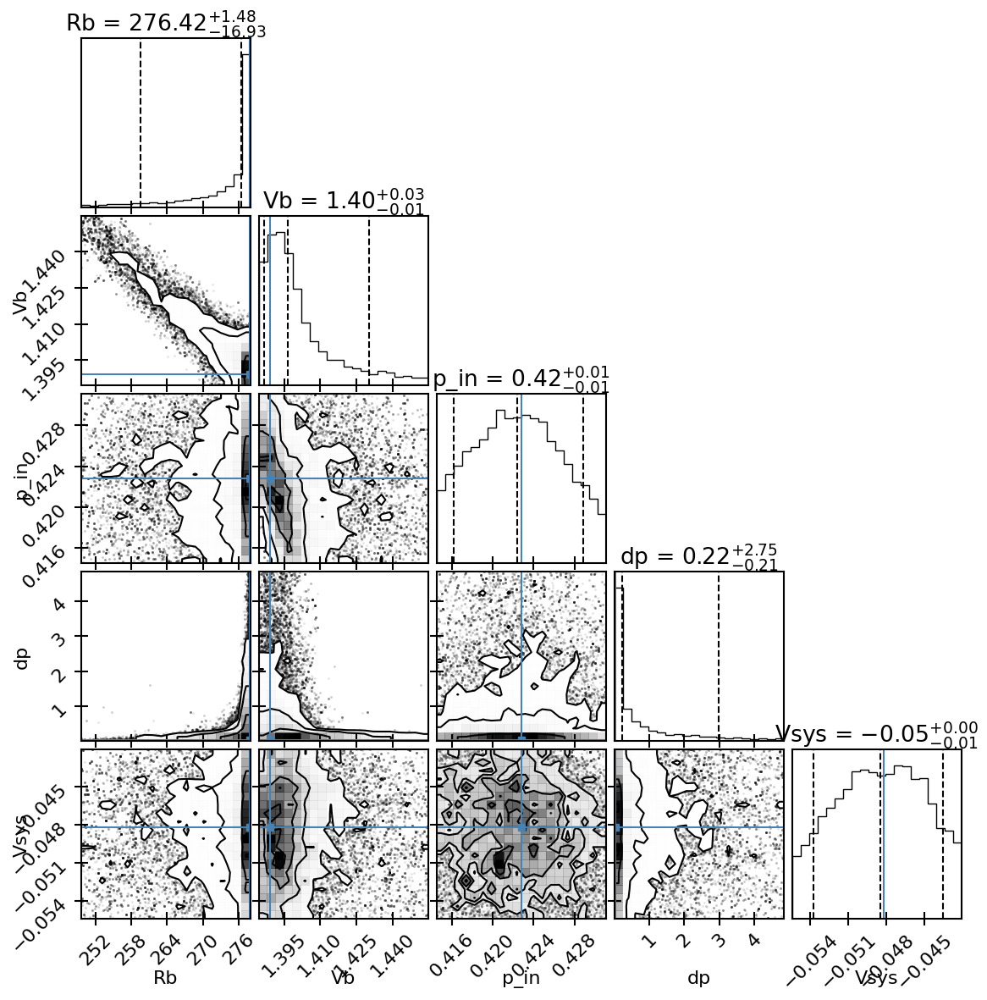

Corner plots in pvanalysis_Oph1_C18O_mTTT_tr3.corner_e.png and pvanalysis_Oph1_C18O_mTTT_tr3.corner_r.png
--- Edge ---
R_b   = 173.87 +/- 57.73 au
V_b   = 2.212 +/- 0.497 km/s
p_in  = 0.529 +/- 0.060
dp    = 0.232 +/- 0.157
v_sys = 2.274 +/- 0.018
r     = 58.72 --- 278.00 au
v     = 1.522 --- 3.900 km/s
M_in  = 1.141 +/- 0.632 Msun
M_out = 0.840 +/- 0.594 Msun
M_b   = 1.073 +/- 0.600 Msun


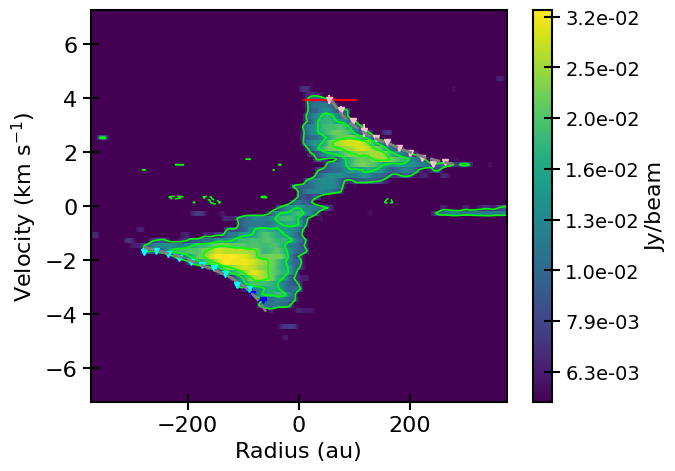

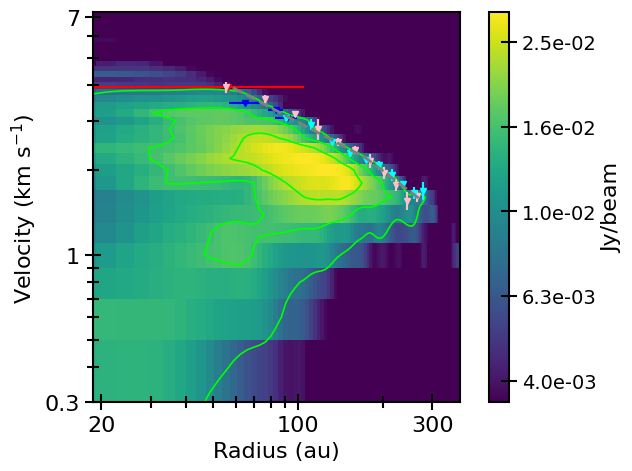

In [4]:
#Numero de iteraciones que vamos a realizar
N_iter=10

#Listas en las que guardaremos los parámetros del fit.
rb=[]
rb_error=[]
vb=[]
vb_error=[]
pin=[]
pin_error=[]
dp=[]
dp_error=[]
pout=[]
v_sys=[]
v_sys_error=[]
M_in=[]
M_in_error=[]
M_out=[]
M_out_error=[]
M_b=[]
M_b_error=[]
pout_error=[]

for i in range(N_iter):
##############Extraemos los datos
    impv = PVAnalysis(fitsfile, rms, vsys, dist, pa=51.34)
    impv.get_edgeridge(outname, thr=thr, ridgemode=ridgemode, incl=incl,
                       use_position=use_position, use_velocity=use_velocity,
                       Mlim=Mlim, xlim=np.array(xlim) / dist, vlim=vlim,
                       minabserr=minabserr, minrelerr=minrelerr,
                       nanbeforemax=True, nanopposite=True, nanbeforecross=True)
    impv.write_edgeridge(outname=outname)
    impv.fit_edgeridge(include_vsys=include_vsys,
                       include_dp=include_dp,
                       include_pin=include_pin,
                       outname=outname, rangelevel=0.8,
                       show_corner=show_corner)
    fit_result=impv.output_fitresult()
    
    impv.plot_fitresult(vlim=vlim_plot, xlim=xlim_plot, flipaxis=False,
                        clevels=[-9,-6,-3,3,6,9], outname=outname,
                        show=show_pv, logcolor=True, Tbcolor=False,
                        kwargs_pcolormesh={'cmap':'viridis'},
                        kwargs_contour={'colors':'lime'},
                        fmt={'edge':'v', 'ridge':'o'},
                        linestyle={'edge':'--', 'ridge':'-'},
                        plotridgepoint=False, plotedgepoint=True,
                        plotridgemodel=False, plotedgemodel=True)
    
    
    

    #Leemos fits y extraemos los datos
    name=outname+'.edge.dat'
    file=open(name,'r')
    texto=file.read()
    lista= texto.split()
    np.shape(lista)
    
    #Datos extraidos
    #Añadimos los datos extraidos a listas
    rb.append(fit_result[0])
    vb.append( fit_result[1])
    pin.append( fit_result[2])
    dp.append( fit_result[3])
    v_sys.append(vsys-fit_result[4])
    rb_error.append( fit_result[5])
    vb_error.append(fit_result[6])
    pin_error.append(fit_result[7])
    dp_error.append(fit_result[8])
    v_sys_error.append(fit_result[9])
    M_in.append(fit_result[10])
    M_out.append(fit_result[11])
    M_b.append(fit_result[12])
    M_in_error.append(fit_result[13])
    M_out_error.append(fit_result[14])
    M_b_error.append(fit_result[15])
    pout_value=fit_result[2] + fit_result[3]
    pout.append(pout_value)
    #Calculamos pout_error usando propagacion de errores
    pout_error_value=np.sqrt(fit_result[7]**2 + fit_result[8]**2)
    pout_error.append(pout_error_value)
    
    if txt_files: #Si txt_files= True se guardaran los parámetros en un txt.
     
        #Creamos los archivos de texto con todos los parámetros extraídos
        file_txt = open("C:/Users/josem/SLAM - test/Archivos Fits/Parametros fits/"+filename + str(i), "w")
        file_txt.write(outname + os.linesep)
        file_txt.write('rb= ' + str(fit_result[0]) + os.linesep)
        file_txt.write('rb_error= ' + str(fit_result[5]) + os.linesep)
        file_txt.write('vb= ' + str(fit_result[1]) + os.linesep)
        file_txt.write('vb_error= ' + str(fit_result[6]) + os.linesep)
        file_txt.write('pin= ' + str(fit_result[2]) + os.linesep)
        file_txt.write('pin_error= ' + str(fit_result[7]) + os.linesep)
        file_txt.write('dp= ' + str(fit_result[3]) + os.linesep)
        file_txt.write('dp_error= ' + str(fit_result[8]) + os.linesep)
        file_txt.write('pout= ' + str(pout_value) + os.linesep)
        file_txt.write('pout_error= ' + str(pout_error_value) + os.linesep)
        file_txt.write('v_sys= ' + str(vsys-fit_result[4]) + os.linesep)
        file_txt.write('vsys_error= ' + str(fit_result[9]) + os.linesep)
        file_txt.write('M_in= ' + str(fit_result[10]) + os.linesep)
        file_txt.write('M_in_error= ' + str(fit_result[13]) + os.linesep)
        file_txt.write('M_out= ' + str(fit_result[11]) + os.linesep)
        file_txt.write('M_out_error= ' + str(fit_result[14]) + os.linesep)
        file_txt.write('M_b= ' + str(fit_result[12]) + os.linesep)
        file_txt.write('M_b_error= ' + str(fit_result[15]) + os.linesep)
        file_txt.close()
    


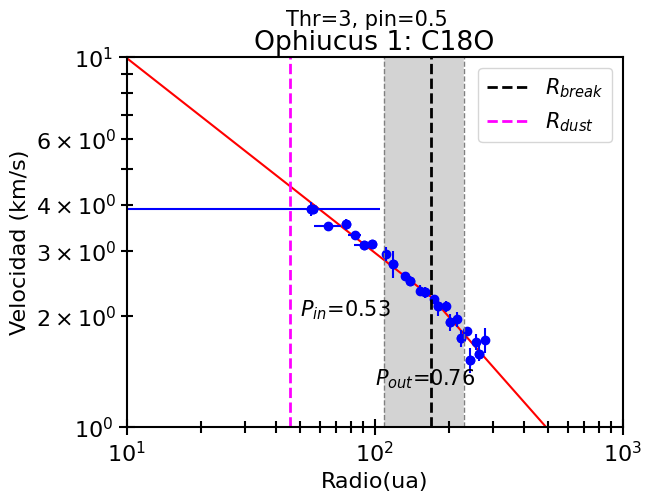

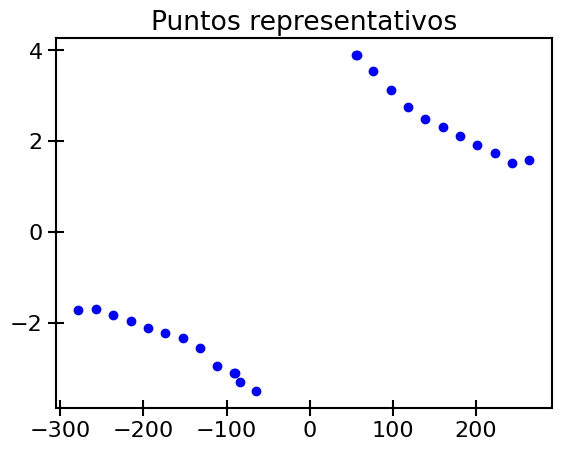

In [5]:
#tomamos promedio de parámetros obtenidos

rb_mean= statistics.mean(rb)
rb_error_mean= statistics.mean(rb_error)
vb_mean= statistics.mean(vb)
vb_error_mean= statistics.mean(vb_error)
pin_mean= statistics.mean(pin)
pin_error_mean= statistics.mean(pin_error)
dp_mean= statistics.mean(dp)
dp_error_mean= statistics.mean(dp_error)
pout_mean= statistics.mean(pout)
v_sys_mean= statistics.mean(v_sys)
v_sys_error_mean= statistics.mean(v_sys_error)
M_in_mean= statistics.mean(M_in)
M_in_error_mean= statistics.mean(M_in_error)
M_out_mean= statistics.mean(M_out)
M_out_error_mean= statistics.mean(M_out_error)
M_b_mean= statistics.mean(M_b)
M_b_error_mean= statistics.mean(M_b_error)
pout_error_mean= statistics.mean(pout_error)



#generamos txt con los resultados
#Creamos los archivos de texto con todos los parámetros extraídos
file_txt = open("C:/Users/josem/SLAM - test/Archivos Fits/Resumen/"+ 'Resumen  '+ str(filename) , "w")
file_txt.write(outname + os.linesep)
file_txt.write('rb= ' + str(rb_mean) + os.linesep)
file_txt.write('rb_error= ' + str(rb_error_mean) + os.linesep)
file_txt.write('vb= ' + str(vb_mean) + os.linesep)
file_txt.write('vb_error= ' + str(vb_error_mean) + os.linesep)
file_txt.write('pin= ' + str(pin_mean) + os.linesep)
file_txt.write('pin_error= ' + str(pin_error_mean) + os.linesep)
file_txt.write('dp= ' + str(dp_mean) + os.linesep)
file_txt.write('dp_error= ' + str(dp_error_mean) + os.linesep)
file_txt.write('pout= ' + str(pout_mean) + os.linesep)
file_txt.write('pout_error= ' + str(pout_error_mean) + os.linesep)
file_txt.write('v_sys= ' + str(v_sys_mean) + os.linesep)
file_txt.write('vsys_error= ' + str(v_sys_error_mean) + os.linesep)
file_txt.write('M_in= ' + str(M_in_mean) + os.linesep)
file_txt.write('M_in_error= ' + str(M_in_error_mean) + os.linesep)
file_txt.write('M_out= ' + str(M_out_mean) + os.linesep)
file_txt.write('M_out_error= ' + str(M_out_error_mean) + os.linesep)
file_txt.write('M_b= ' + str(M_b_mean) + os.linesep)
file_txt.write('M_b_error= ' + str(M_b_error_mean) + os.linesep)
file_txt.close()

################### Comienzo del fiteo

name=outname+'.edge.dat'
file=open(name,'r')
texto=file.read()
lista= texto.split()
np.shape(lista)
x=np.arange(0.1,1000,0.1)

for i in range(9):
    lista.pop(0)
    
fila1=[]
fila2=[]
fila3=[]
fila4=[]

for i in range(len(lista)):
    elemento=float(lista[i])
    if i%4==0:
        fila1.append(elemento)
    
    if i%4==1:
        fila2.append(elemento)
    
    if i%4==2:
        fila3.append(elemento)
        
    if i%4==3:
        fila4.append(elemento)    

Fila1=np.array(fila1)
Fila2=np.array(fila2)
Fila3=np.array(fila3)
Fila4=np.array(fila4)
radios=np.ones(len(fila1))*rb_mean
deltaplus=np.ones(len(fila1))*(rb_mean+rb_error_mean)
deltaminus=np.ones(len(fila1))*(rb_mean-rb_error_mean)
plt.loglog(Fila1,Fila3,'bo')

#Funcion que modela las velocidades
def g(x,p,q):
    vel=np.zeros(len(x))
    for i in range(len(x)):
        if abs(x[i])<rb_mean:
            vel[i]=vb_mean*(x[i]/rb_mean)**-p
        if abs(x[i])>rb_mean:
            vel[i]=vb_mean*(x[i]/rb_mean)**-q
    
    return vel

fitx=g(x,pin_mean,pout_mean)
pin_round= round(pin_mean,2)
pout_round= round(pout_mean,2)

positivos=[]
#Sacamos el minimo del grafico xlim
for i in range(len(Fila1)):
    if Fila1[i]>0:
        positivos.append(Fila1[i])


max_grafico=max(Fila1)+ 100



########################################################################################################
########################################################################################################
#Probamos con valor absoluto

plt.plot(x,fitx,'r')
#plt.loglog(Fila1,fit,'r')
plt.loglog(abs(Fila1),abs(Fila3),'bo')
plt.ylim(1,10)
plt.xlim(10,1000)
ejex=np.arange(0,1,1)
a=plt.axvline(x=rb_mean, ymin=0, ymax=10,color = "black", linewidth = 2, linestyle = "dashed")
b=plt.axvline(x=rb_mean-rb_error_mean, ymin=0, ymax=10,color = "gray", linewidth = 1, linestyle = "dashed")
c=plt.axvline(x=rb_mean+rb_error_mean, ymin=0, ymax=10,color = "gray", linewidth = 1, linestyle = "dashed")
d=plt.axvline(x=R_dust, ymin=0, ymax=10,color = "magenta", linewidth = 2, linestyle = "dashed")
deltaminus=rb_mean-rb_error_mean
deltaplus=rb_mean+rb_error_mean
plt.fill_betweenx(fitx, deltaminus, deltaplus,facecolor='lightgray')
plt.legend([a,d],['$R_{break}$','$R_{dust}$'],loc='upper right',fontsize=15)
plt.text( 50,2,'$P_{in}$='+ str(pin_round), fontsize=15, color='black')
plt.text( 100,1.3,'$P_{out}$='+ str(pout_round), fontsize=15, color='black')
plt.errorbar(abs(Fila1),abs(Fila3),yerr=Fila4,xerr=Fila2,fmt = 'bo', ms=1)
plt.title('Ophiucus 1: C18O')
plt.suptitle("Thr=3, pin=0.5", fontsize='15')
plt.xlabel('Radio(ua)')
plt.ylabel('Velocidad (km/s)')
plt.savefig("GRAFICO"+ outname+'abs' , dpi=300, bbox_inches='tight')

plt.show()

########################################################################################################
########################################################################################################
#Mostramos los puntos

plt.plot(Fila1,Fila3,'bo')
plt.title('Puntos representativos')
plt.show()